In [8]:
!wget https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz

--2020-05-09 00:20:54--  https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.8.6, 2620:100:601b:6::a27d:806
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.8.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 418980035 (400M) [application/octet-stream]
Saving to: ‘dataset-sample.tar.gz’

dataset-sample.tar. 100%[===================>] 399.57M  46.0MB/s    in 8.5s    

2020-05-09 00:21:04 (46.7 MB/s) - ‘dataset-sample.tar.gz’ saved [418980035/418980035]



In [9]:
%ls

dataset-sample.tar.gz  sample_data/


In [10]:
!tar -xzvf dataset-sample.tar.gz



dataset-sample/
dataset-sample/elevations/
dataset-sample/elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
dataset-sample/elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif
dataset-sample/elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
dataset-sample/images/
dataset-sample/images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
dataset-sample/images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif
dataset-sample/images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif
dataset-sample/index.csv
dataset-sample/labels/
dataset-sample/labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
dataset-sample/labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
dataset-sample/labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png


In [11]:
%ls

dataset-sample/  dataset-sample.tar.gz  sample_data/


In [12]:
%cd dataset-sample/

/content/dataset-sample


In [13]:
!find

.
./labels
./labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
./labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
./elevations
./elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif
./elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
./elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
./index.csv
./images
./images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif
./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif


In [0]:
import pandas as pd
imageInfo = pd.read_csv('index.csv', sep=' ')

In [15]:
imageInfo.shape

(3, 12)

In [16]:
print(imageInfo)

  status                               name  ...  percentage_car  percentage_ignore
0   GOOD       1d4fbe33f3_F1BE1D4184INSPIRE  ...            0.09              18.08
1   GOOD       e1d3e6f6ba_B4DE0FB544INSPIRE  ...            0.12              46.47
2   GOOD  ec09336a6f_06BA0AF311OPENPIPELINE  ...            0.17              31.71

[3 rows x 12 columns]


In [17]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.width= 1000

print(imageInfo)

  status                               name  rows  cols  visible_classes  percentage_building  percentage_clutter  percentage_vegetation  percentage_water  percentage_ground  percentage_car  percentage_ignore
0   GOOD       1d4fbe33f3_F1BE1D4184INSPIRE  5542  2962                7                21.52                0.41                  15.42              1.63              42.85            0.09              18.08
1   GOOD       e1d3e6f6ba_B4DE0FB544INSPIRE  8408  5924                7                 3.43                1.10                   4.44              1.51              42.94            0.12              46.47
2   GOOD  ec09336a6f_06BA0AF311OPENPIPELINE  4968  7262                6                 2.93                1.29                  22.26              0.00              41.65            0.17              31.71


In [18]:
print(imageInfo.T)

                                                  0                             1                                  2
status                                         GOOD                          GOOD                               GOOD
name                   1d4fbe33f3_F1BE1D4184INSPIRE  e1d3e6f6ba_B4DE0FB544INSPIRE  ec09336a6f_06BA0AF311OPENPIPELINE
rows                                           5542                          8408                               4968
cols                                           2962                          5924                               7262
visible_classes                                   7                             7                                  6
percentage_building                           21.52                          3.43                               2.93
percentage_clutter                             0.41                           1.1                               1.29
percentage_vegetation                         15.42             

In [19]:
imageInfo['path_image'] = './images/'+imageInfo['name']+'-ortho.tif'
imageInfo['path_elevation'] = './elevations/'+imageInfo['name']+'-elev.tif'
imageInfo['path_label'] = './labels/'+imageInfo['name']+'-label.png'

print(imageInfo.T)

                                                                       0                                                  1                                                  2
status                                                              GOOD                                               GOOD                                               GOOD
name                                        1d4fbe33f3_F1BE1D4184INSPIRE                       e1d3e6f6ba_B4DE0FB544INSPIRE                  ec09336a6f_06BA0AF311OPENPIPELINE
rows                                                                5542                                               8408                                               4968
cols                                                                2962                                               5924                                               7262
visible_classes                                                        7                                                  7  

In [20]:
imageInfo0 = imageInfo.iloc[0]
print(imageInfo0['path_image'])
print(imageInfo.iloc[0].path_image)

print(imageInfo0['path_label'])
print(imageInfo.iloc[0].path_label)

./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png


In [21]:
for i,r in imageInfo.iterrows():
  print(i,r[['name','visible_classes']])

0 name               1d4fbe33f3_F1BE1D4184INSPIRE
visible_classes                               7
Name: 0, dtype: object
1 name               e1d3e6f6ba_B4DE0FB544INSPIRE
visible_classes                               7
Name: 1, dtype: object
2 name               ec09336a6f_06BA0AF311OPENPIPELINE
visible_classes                                    6
Name: 2, dtype: object


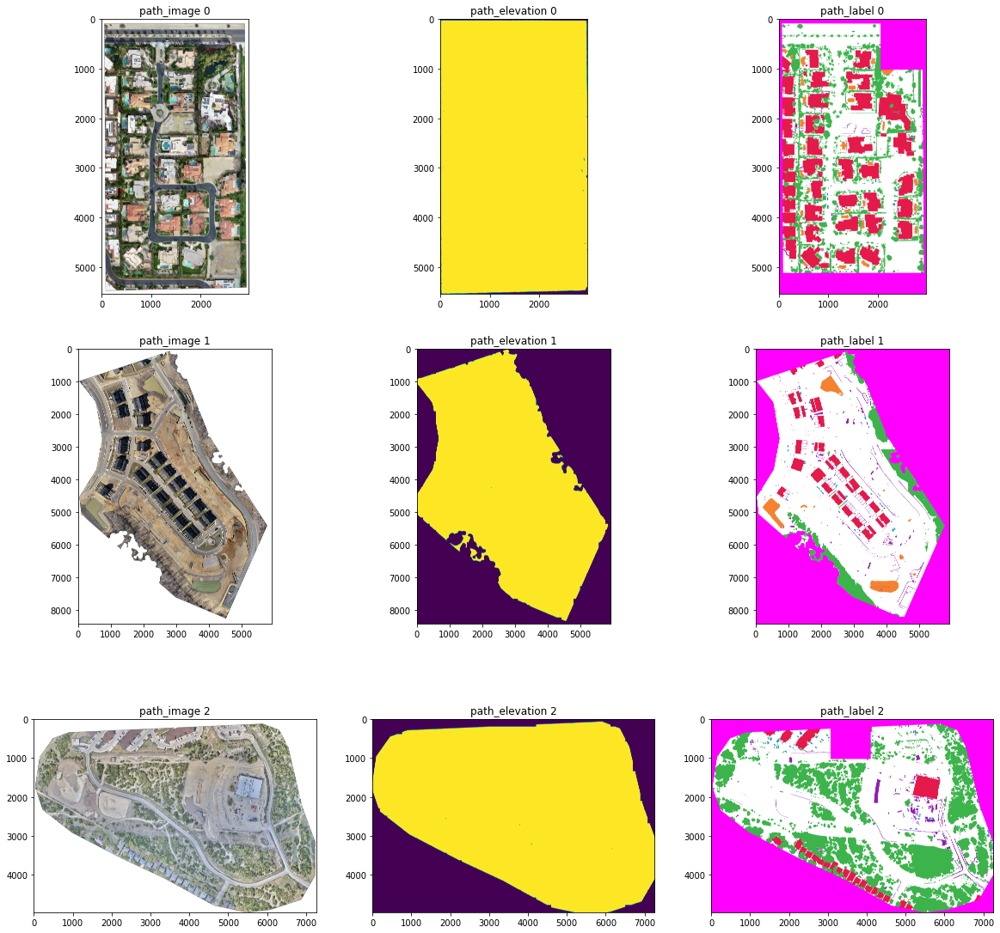

In [22]:
import imageio
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = [20, 20]

image_types = ['path_image','path_elevation','path_label']
image_type_count = len(image_types)
image_set_count = imageInfo.shape[0]

fig, axs = plt.subplots(image_set_count, image_type_count)
for index, row in imageInfo.iterrows():
  figure_column = 0
  for image_type in image_types:
    axs[index,figure_column].imshow(imageio.imread(row[image_type]))
    axs[index,figure_column].set_title(image_type+' '+str(index))
    figure_column += 1

Text(0.5, 1.0, 'Blue Channel')

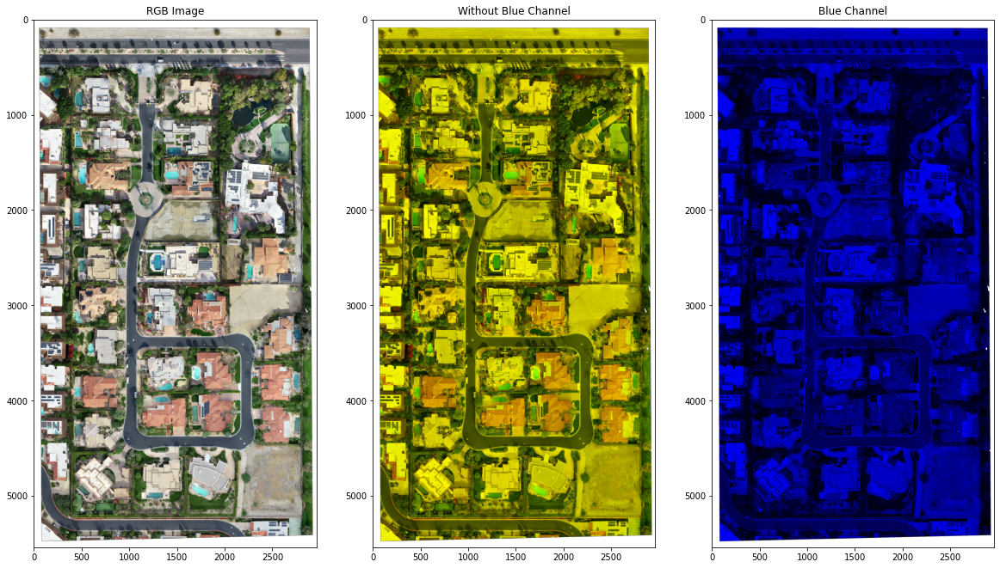

In [23]:
imageRGB = imageio.imread(imageInfo.iloc[0].path_image)
imageRG = imageRGB.copy()
imageRG[:,:,2] = 0
imageB = imageRGB.copy()
imageB[:,:,0:2] = 0

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGB);axs[0].set_title('RGB Image')
axs[1].imshow(imageRG);axs[1].set_title('Without Blue Channel')
axs[2].imshow(imageB);axs[2].set_title('Blue Channel')

In [24]:
imageRGB = imageio.imread(imageInfo.iloc[0].path_image)
print(imageRGB.shape)
imageRGB_flat = imageRGB.reshape(-1, imageRGB.shape[-1])
print(imageRGB_flat.shape)

(5542, 2962, 4)
(16415404, 4)


In [0]:
imageRG_flat = imageRGB_flat[:,0:2]
imageB_flat = imageRGB_flat[:,2]

In [0]:
imageRG_flat_subsample = imageRG_flat[::100]
imageB_flat_subsample = imageB_flat[::100]

In [27]:
print(imageRG_flat_subsample.shape)
print(imageB_flat_subsample.shape)

(164155, 2)
(164155,)


In [28]:
from sklearn.ensemble import GradientBoostingRegressor
blueModel = GradientBoostingRegressor(n_estimators=100, learning_rate=1,
                                      max_depth=1, random_state=0, loss='huber', verbose=1).fit(imageRG_flat_subsample, imageB_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1         783.2377            6.13s
         2         555.6822            6.10s
         3         474.3631            6.10s
         4         386.4598            6.11s
         5         332.1460            6.07s
         6         309.2735            6.01s
         7         281.7053            5.97s
         8         266.1851            5.93s
         9         256.6886            5.88s
        10         245.0302            5.81s
        20         204.6582            5.32s
        30         186.5296            4.70s
        40         178.6180            4.05s
        50         171.8837            3.40s
        60         166.9794            2.73s
        70         163.8827            2.06s
        80         161.3088            1.38s
        90         159.4628            0.69s
       100         158.2026            0.00s


In [0]:
imageB_flat_model = blueModel.predict(imageRG_flat)

inshape = imageRGB.shape
imageB_model = imageB_flat_model.reshape(inshape[0:2])

Text(0.5, 1.0, 'The Difference')

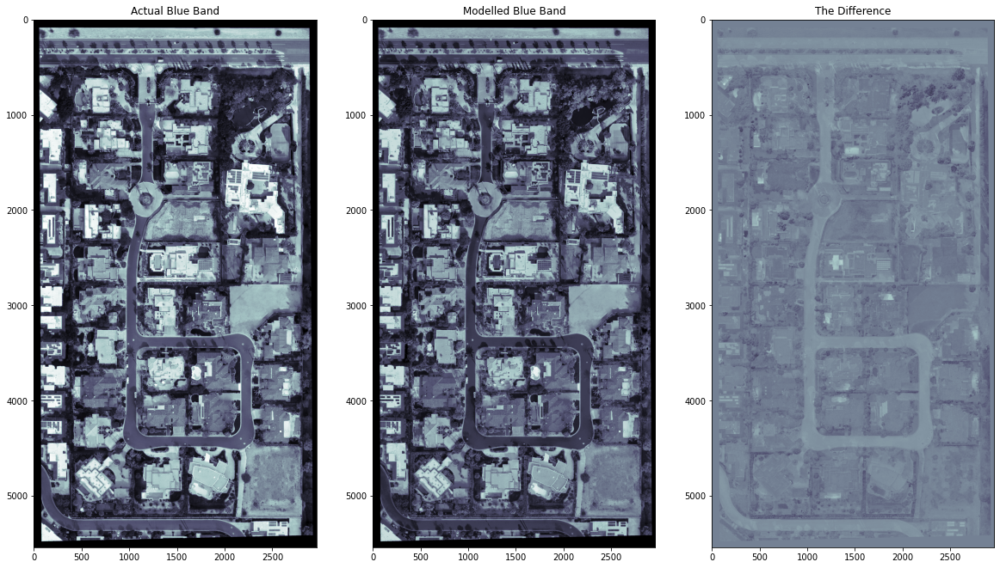

In [30]:
imageB_band = imageB[:,:,2]

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageB_band, cmap='bone');axs[0].set_title('Actual Blue Band')
axs[1].imshow(imageB_model, cmap='bone');axs[1].set_title('Modelled Blue Band')
axs[2].imshow(imageB_band-imageB_model, cmap='bone');axs[2].set_title('The Difference')

Text(0.5, 1.0, 'Blue Averged from Red and Green')

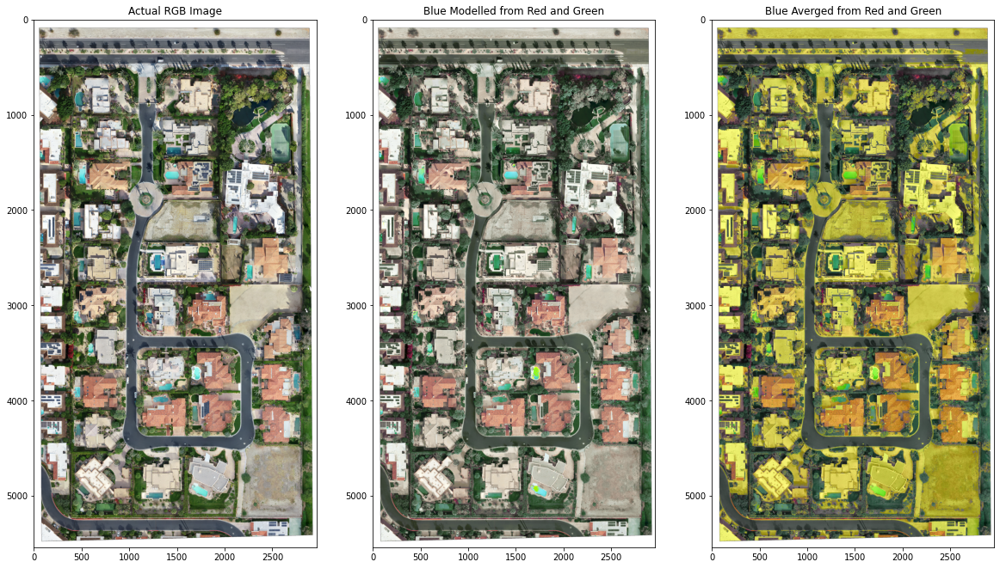

In [31]:
imageRGB_model = imageRGB.copy()
imageRGB_model[:,:,2] = imageB_model

imageRGB_naive = imageRGB.copy()
imageRGB_naive[:,:,2] = (imageRGB[:,:,1] + imageRGB[:,:,0])//2

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGB);axs[0].set_title('Actual RGB Image')
axs[1].imshow(imageRGB_model);axs[1].set_title('Blue Modelled from Red and Green')
axs[2].imshow(imageRGB_naive);axs[2].set_title('Blue Averged from Red and Green')

In [0]:
def applyBlueModel(inRGB, blueModel):
  inRGB_flat = inRGB.reshape(-1, inRGB.shape[-1])
  inRG_flat = inRGB_flat[:,0:2]
  outB_flat_model = blueModel.predict(inRG_flat)
  outB_model = outB_flat_model.reshape(inRGB.shape[0:2])
  outRGB = inRGB.copy()
  outRGB[:,:,2] = outB_model

  return outRGB

Text(0.5, 1.0, 'modelled 2')

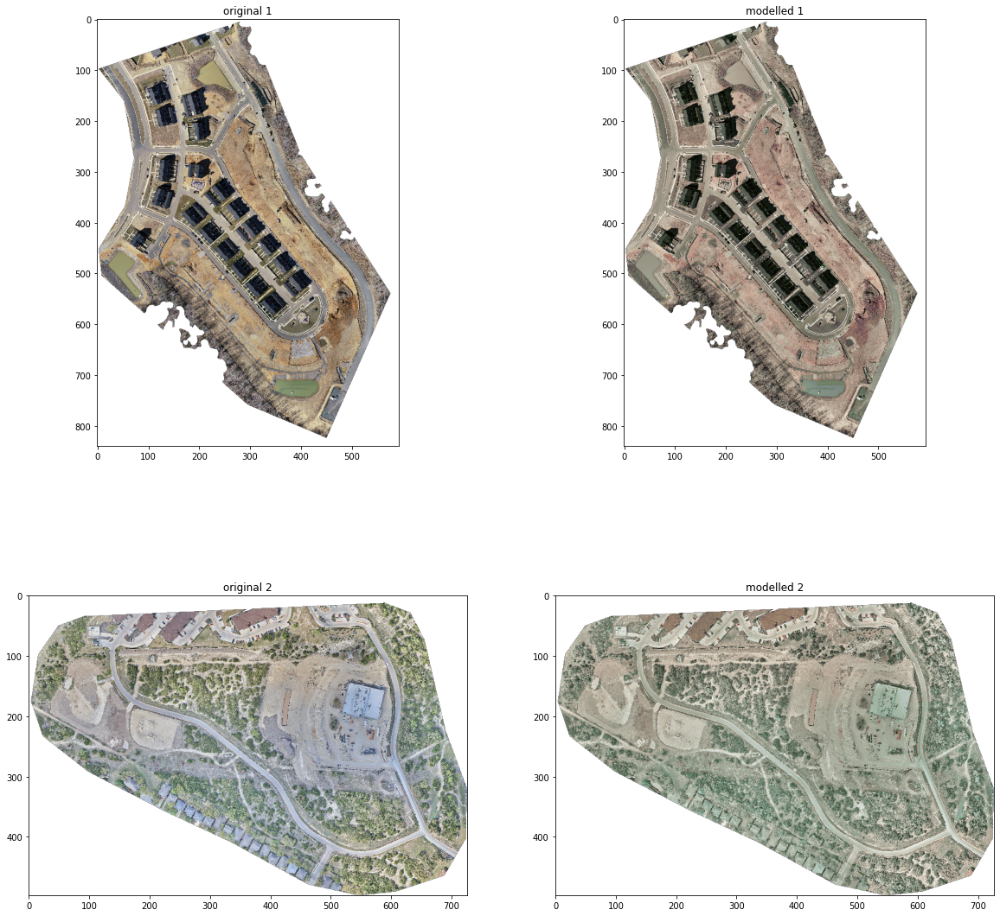

In [33]:
imageRGB_2 = imageio.imread(imageInfo.iloc[2].path_image)[::10,::10]
imageRGB_2_model = applyBlueModel(imageRGB_2, blueModel)
imageRGB_1 = imageio.imread(imageInfo.iloc[1].path_image)[::10,::10]
imageRGB_1_model = applyBlueModel(imageRGB_1, blueModel)

fig, axs = plt.subplots(2, 2)
axs[0,0].imshow(imageRGB_1);axs[0,0].set_title('original 1')
axs[0,1].imshow(imageRGB_1_model);axs[0,1].set_title('modelled 1')
axs[1,0].imshow(imageRGB_2);axs[1,0].set_title('original 2')
axs[1,1].imshow(imageRGB_2_model);axs[1,1].set_title('modelled 2')



In [34]:
import numpy as np

reduction = 10
imagelabel = imageio.imread(imageInfo.iloc[0].path_label)[::reduction,::reduction,:]
imagelabel.shape

(555, 297, 3)

In [0]:
lut_rgb = {(255, 0, 255) : 0,
        (230, 25, 75) : 1,
        (145, 30, 180) : 2,
        (60, 180, 75) : 3,
        (245, 130,48) : 4,
        (255, 255, 255) : 5,
        (0,130,200) : 6}

# i didnt know you could define a function witin a function
def rgb2label(rgb_array):
  def indexLUT(rgb_array):
    return lut_rgb[tuple(rgb_array)]
  label_array = np.apply_along_axis(indexLUT, 2, rgb_array)
  return label_array

In [36]:
imagelabel_value = rgb2label(imagelabel)
imagelabel_value.shape

(555, 297)

In [0]:
lut_label =np.array([[255, 0, 255],
      [230, 25, 75],
      [145, 30, 180],
      [60, 180, 75],
      [245, 130,48],
      [255, 255, 255],
      [0,130,200]])

def label2rgb(label_array):
  rgb_array = np.zeros(label_array.shape + (3,), dtype=np.uint8)
  rgb_array = np.take(lut_label, label_array, axis=0, out=rgb_array)

  return rgb_array

In [0]:
class_names = ['IGNORE', 'BUILDING', 'CLUTTER', 'VEGETATION', 'WATER', 'GROUND', 'CAR']

In [39]:
imagelabel_test = label2rgb(imagelabel_value)
imagelabel_test.shape

(555, 297, 3)

Text(0.5, 1.0, 'Reconstructed RGB Label Test')

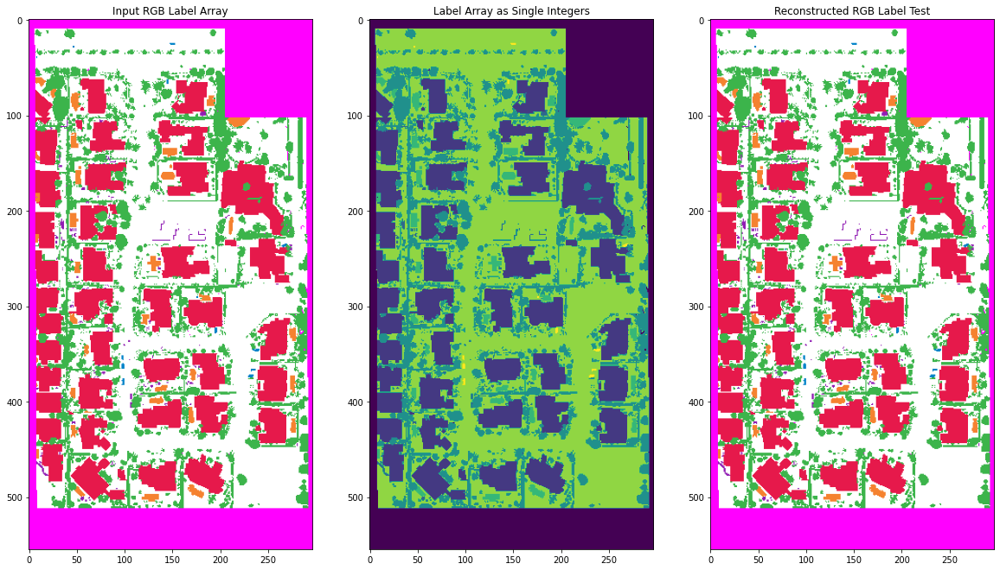

In [40]:
fig, axs = plt.subplots(1, 3)
axs[0].imshow(imagelabel);axs[0].set_title('Input RGB Label Array')
axs[1].imshow(imagelabel_value);axs[1].set_title('Label Array as Single Integers')
axs[2].imshow(imagelabel_test);axs[2].set_title('Reconstructed RGB Label Test')

In [41]:
imageRGBA = imageio.imread(imageInfo.iloc[0].path_image)[::reduction,::reduction,:]
imageRGB = imageRGBA[:,:,0:3]
imageRGB_flat = imageRGB.reshape(-1, imageRGB.shape[-1])
imagelabel_value_flat = imagelabel_value.flatten()
imageRGB_flat_subsample = imageRGB_flat[::100]
imagelabel_value_flat_subsample = imagelabel_value_flat[::100]

print(imageRGB_flat.shape)
print(imagelabel_value_flat.shape)

(164835, 3)
(164835,)


In [0]:
def ourClassifer(examples,targets, dropclass = 0):
  dropMask = targets==dropclass
  targets = targets[~dropMask]
  examples = examples[~dropMask,:]

  from sklearn.ensemble import GradientBoostingClassifier
  classModel = GradientBoostingClassifier(n_estimators=1000, learning_rate=0.1,max_depth=1, random_state=0,verbose=1).fit(examples, targets)
  return classModel

In [43]:
clf = ourClassifer(imageRGB_flat_subsample, imagelabel_value_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1        1476.2301           10.67s
         2        1410.7299            8.97s
         3        1377.0139            8.67s
         4        1349.4638            8.71s
         5        1328.0487            8.39s
         6        1309.2923            8.29s
         7        1292.8467            8.13s
         8        1279.8320            8.03s
         9        1267.8242            7.91s
        10        1257.8234            7.81s
        20        1195.8254            7.21s
        30        1165.1673            7.09s
        40        1142.8452            6.94s
        50        1123.9527            6.81s
        60        1107.7336            6.74s
        70        1093.9957            6.66s
        80        1080.9665            6.64s
        90        1069.8470            6.62s
       100        1059.2294            6.54s
       200         986.2218            5.80s
       300         941.6997            5.05s
       40

Text(0.5, 1.0, 'Modeled Labels: GBDT Regression (RGB)')

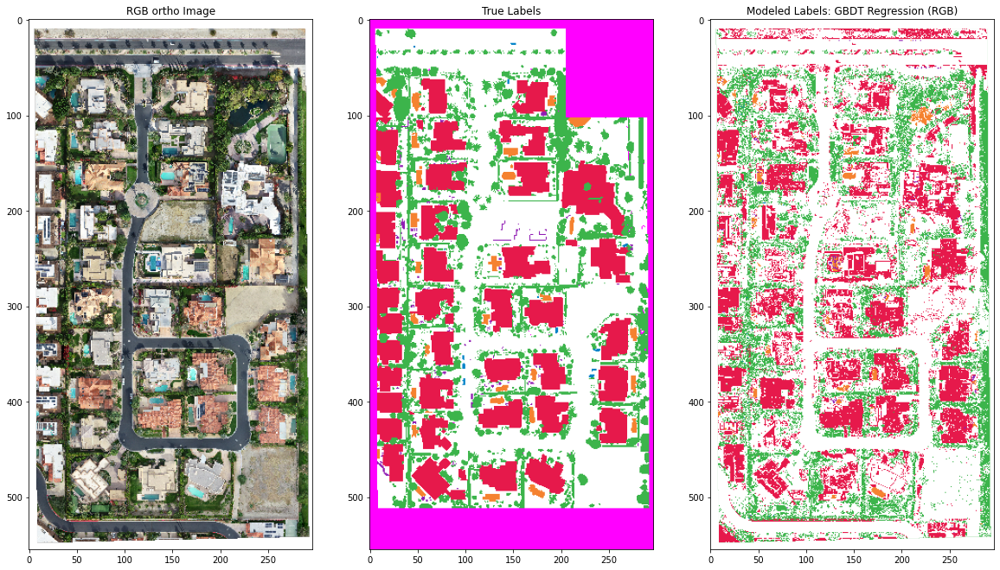

In [44]:
imagelabel_value_flat_model = clf.predict(imageRGB_flat)
plt.rcParams['figure.figsize'] = [20, 20]
inshape = imageRGB.shape
imagelabel_value_model = imagelabel_value_flat_model.reshape(inshape[0:2])
imagelabel_model = label2rgb(imagelabel_value_model)
imagelabel_model = np.dstack([imagelabel_model,imageRGBA[:,:,3]]) 
fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('True Labels')
axs[2].imshow(imagelabel_model);axs[2].set_title('Modeled Labels: GBDT Regression (RGB)')

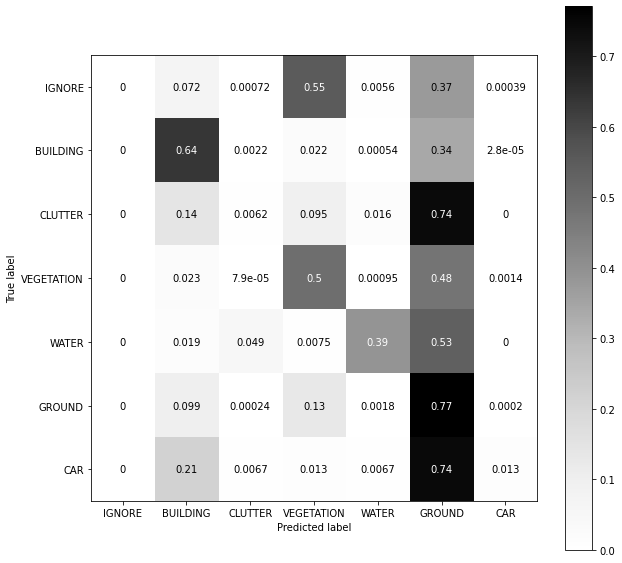

In [45]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] 
plot_confusion_matrix(clf, imageRGB_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',normalize='true')
plt.rcParams['figure.figsize'] = [20, 20]

Text(0.5, 1.0, 'Class After Subsample')

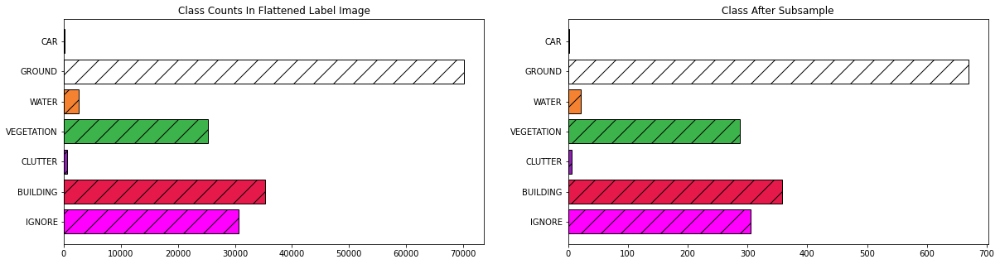

In [46]:
fig, ax = plt.subplots(1,2)
fig.set_figheight(5)

labels, counts = np.unique(imagelabel_value_flat,return_counts=True)
ax[0].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[0].set_yticks(np.arange(len(class_names)))
ax[0].set_yticklabels(class_names)
ax[0].set_title('Class Counts In Flattened Label Image')

labels, counts = np.unique(imagelabel_value_flat_subsample,return_counts=True)
ax[1].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[1].set_yticks(np.arange(len(class_names)))
ax[1].set_yticklabels(class_names)
ax[1].set_title('Class After Subsample')

In [0]:
listOfSamples_RGB = []
listOfSamples_label = []
reduction = 50 
count = 750

for label in labels: 
  labelSubset = imagelabel_value_flat[::reduction][imagelabel_value_flat[::reduction]==label][:count]
  listOfSamples_label.append(labelSubset)
  featureSubset = imageRGB_flat[::reduction][imagelabel_value_flat[::reduction]==label,:][:count,:]
  listOfSamples_RGB.append(featureSubset)

imageRGB_flat_subsample2 = np.vstack(listOfSamples_RGB)
imagelabel_value_flat_subsample2 = np.hstack(listOfSamples_label)

Text(0.5, 1.0, 'Class Counts After New Subsample')

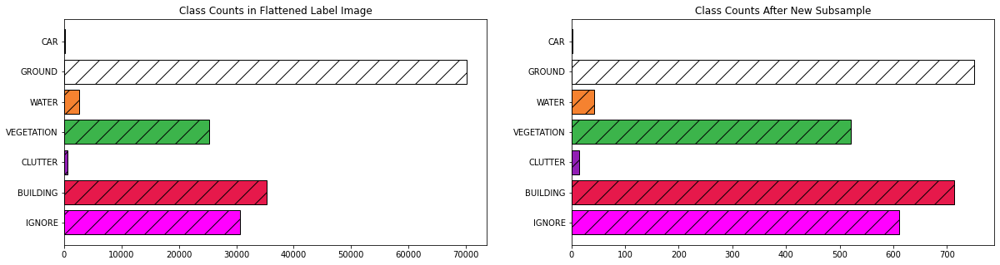

In [48]:
fig, ax = plt.subplots(1,2)
fig.set_figheight(5)

labels, counts = np.unique(imagelabel_value_flat,return_counts=True)
ax[0].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[0].set_yticks(np.arange(len(class_names)))
ax[0].set_yticklabels(class_names)
ax[0].set_title('Class Counts in Flattened Label Image')
labels, counts = np.unique(imagelabel_value_flat_subsample2,return_counts=True)
ax[1].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[1].set_yticks(np.arange(len(class_names)))
ax[1].set_yticklabels(class_names)
ax[1].set_title('Class Counts After New Subsample')

In [49]:
clf2 = ourClassifer(imageRGB_flat_subsample2, imagelabel_value_flat_subsample2)

      Iter       Train Loss   Remaining Time 
         1        2394.8787           13.16s
         2        2299.8111           11.43s
         3        2240.4057           10.64s
         4        2191.6053           10.37s
         5        2153.7530           10.14s
         6        2117.4072           10.07s
         7        2089.0559            9.93s
         8        2064.0481            9.81s
         9        2043.7753            9.73s
        10        2024.9331            9.66s
        20        1921.0716            9.36s
        30        1872.2242            9.68s
        40        1838.1664            9.43s
        50        1810.8165            9.22s
        60        1786.9975            9.12s
        70        1766.0941            8.95s
        80        1747.2418            8.80s
        90        1729.5240            8.70s
       100        1713.7988            8.55s
       200        1602.9184            7.43s
       300        1540.5966            6.45s
       40

Text(0.5, 1.0, 'Modeled Labels: GBDT Regression (RGB)- Select Subsample')

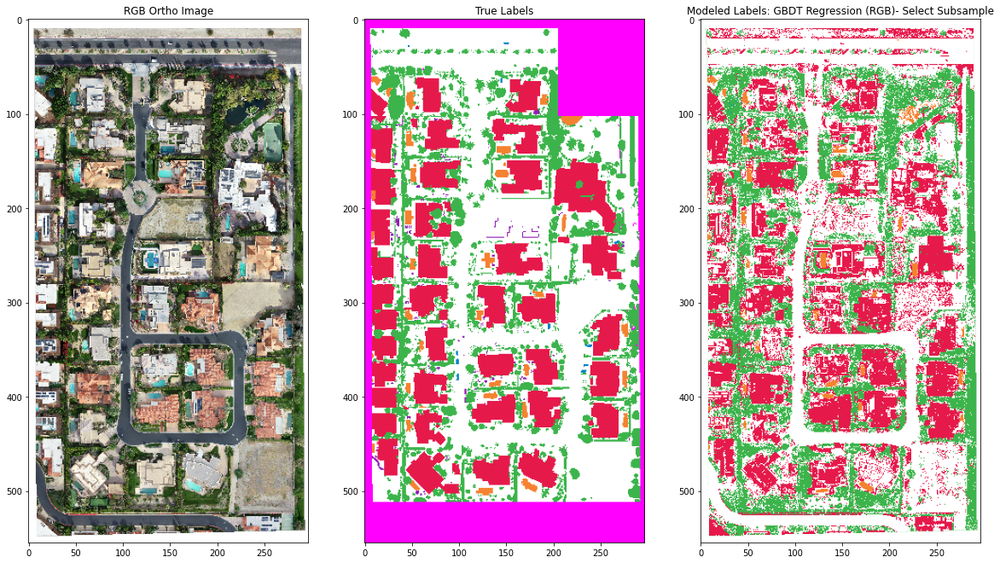

In [50]:
imagelabel_value_flat_model = clf2.predict(imageRGB_flat)
inshape = imageRGB.shape
imagelabel_value_model = imagelabel_value_flat_model.reshape(inshape[0:2])
imagelabel_model = label2rgb(imagelabel_value_model)
imagelabel_model = np.dstack([imagelabel_model, imageRGBA[:,:,3]]) 
fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB Ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('True Labels')
axs[2].imshow(imagelabel_model);axs[2].set_title('Modeled Labels: GBDT Regression (RGB)- Select Subsample')

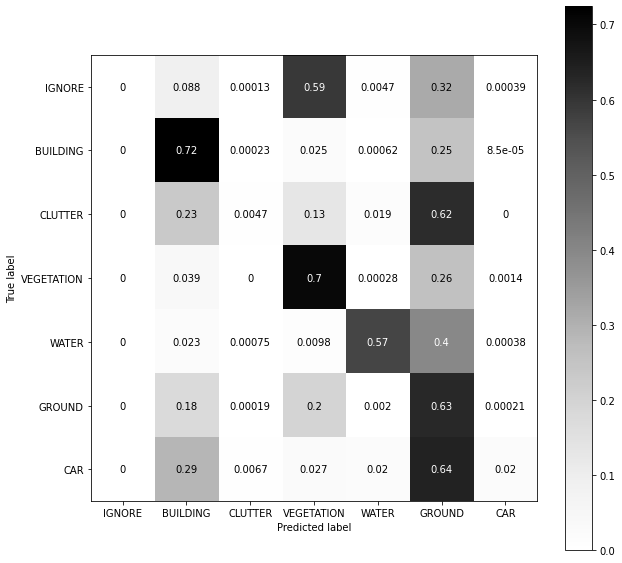

In [51]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] 
plot_confusion_matrix(clf2, imageRGB_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',normalize='true')
plt.rcParams['figure.figsize'] = [20, 20]

In [52]:
reduction=10
elevation32 = imageio.imread(imageInfo.iloc[0].path_elevation)[::reduction,::reduction]
print(elevation32[0,0])

-32767.0


In [0]:
elevation32_nan = elevation32.copy()
elevation32_nan[elevation32_nan==-32767.0] = np.nan

Text(0.5, 1.0, 'Reconstructed RGB Label Test')

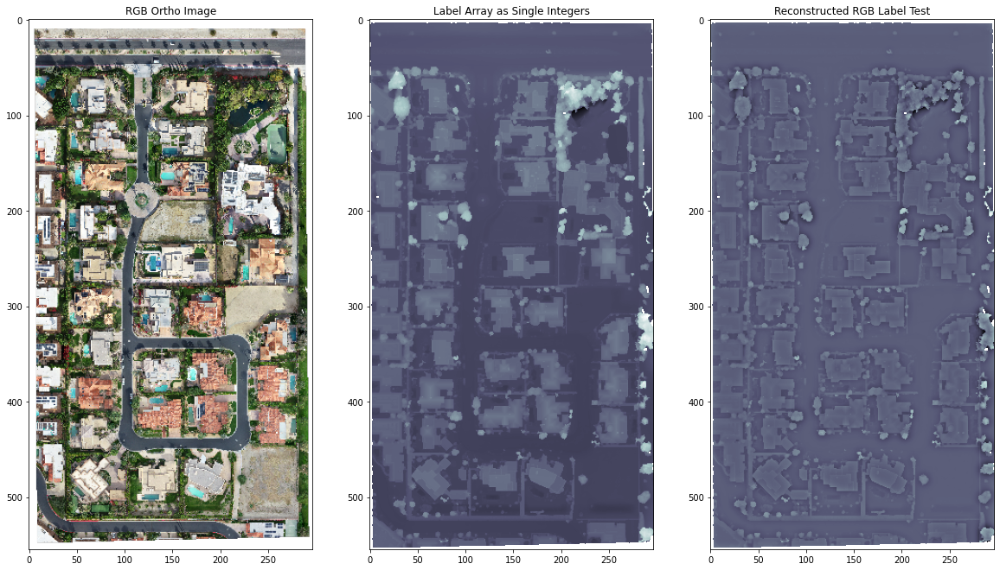

In [54]:
from astropy.convolution import convolve
from astropy.convolution import Gaussian2DKernel
kernel = Gaussian2DKernel(x_stddev=4)
elevation32_tpi = convolve(elevation32_nan, kernel)
elevation32_tpi -= elevation32_nan
elevation32_tpi = -elevation32_tpi 
fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB Ortho Image')
axs[1].imshow(elevation32_nan, cmap='bone');axs[1].set_title('Label Array as Single Integers')
axs[2].imshow(elevation32_tpi, cmap='bone');axs[2].set_title('Reconstructed RGB Label Test')

In [0]:
def float2int(array32):
  array32_norm = array32.copy()
  array32_norm -= np.nanmin(array32_norm)
  array32_norm /= np.nanmax(array32_norm)
  array8 = array32_norm*255
  return array8.astype(np.uint8)

In [56]:
elevation8 = float2int(elevation32_nan)
elevation8_tpi = float2int(elevation32_tpi)
imageRGBE = np.dstack([imageRGB, elevation8,elevation8_tpi])
imageRGBE_flat = imageRGBE.reshape(-1, imageRGBE.shape[-1])
imagelabel_value_flat = imagelabel_value.flatten()
imageRGBE_flat_subsample = imageRGBE_flat[::100]
imagelabel_value_flat_subsample = imagelabel_value_flat[::100]

print(imageRGBE_flat.shape)
print(imagelabel_value_flat.shape)

(164835, 5)
(164835,)


In [57]:
clf3 = ourClassifer(imageRGBE_flat_subsample,imagelabel_value_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1        1397.8793           11.83s
         2        1272.1266           21.30s
         3        1194.3514           18.17s
         4        1129.9567           16.58s
         5        1079.1959           15.60s
         6        1034.6406           14.97s
         7         994.5489           14.55s
         8         959.0131           14.27s
         9         928.7862           14.10s
        10         902.2733           13.98s
        20         748.9891           14.28s
        30         683.6565           12.23s
        40         648.4176           10.94s
        50         623.1370           10.17s
        60         603.8349            9.62s
        70         588.9171            9.22s
        80         577.2746            8.93s
        90         566.3230            8.63s
       100         555.9101            8.41s
       200         492.7190            6.93s
       300         453.4965            5.84s
       40

Text(0.5, 1.0, 'Modeled Labels: GBDT Regression (RGB, Elev & TPI)')

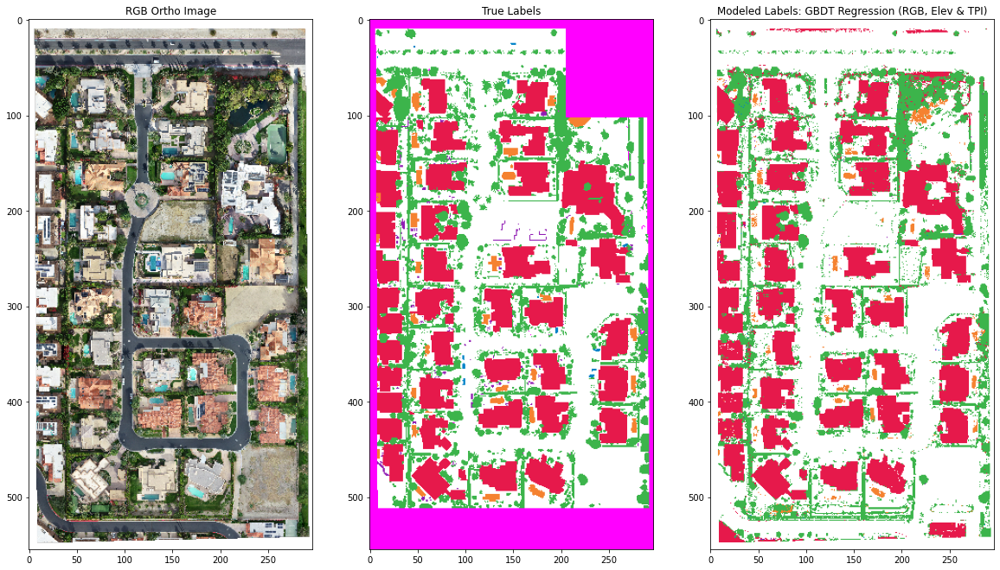

In [58]:
imagelabel_value_flat_model_elevation = clf3.predict(imageRGBE_flat)
inshape = imageRGB.shape
imagelabel_value_model_elevation = imagelabel_value_flat_model_elevation.reshape(inshape[0:2])
imagelabel_model_elevation = label2rgb(imagelabel_value_model_elevation)
imagelabel_model_elevation = np.dstack([imagelabel_model_elevation,imageRGBA[:,:,3]])

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB Ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('True Labels')
axs[2].imshow(imagelabel_model_elevation);axs[2].set_title('Modeled Labels: GBDT Regression (RGB, Elev & TPI)')

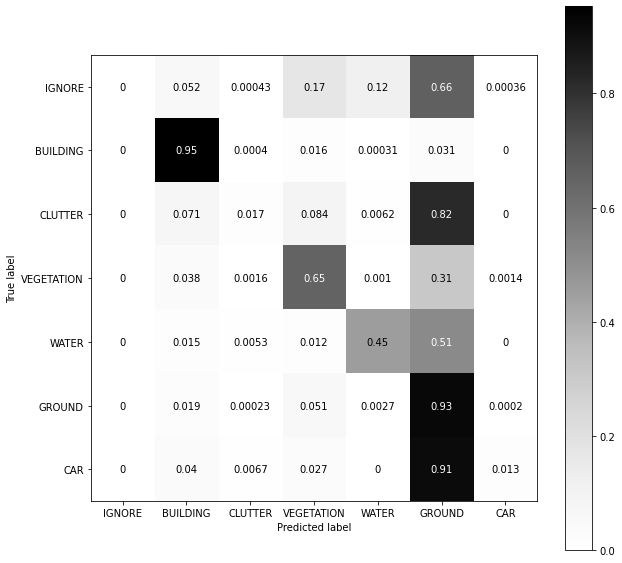

In [59]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] 
plot_confusion_matrix(clf3, imageRGBE_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',normalize='true')
plt.rcParams['figure.figsize'] = [20, 20]

Text(0.5, 1.0, 'Modeled Labels: GBDT Regression (RGB, Elev. & TPI): Filtered')

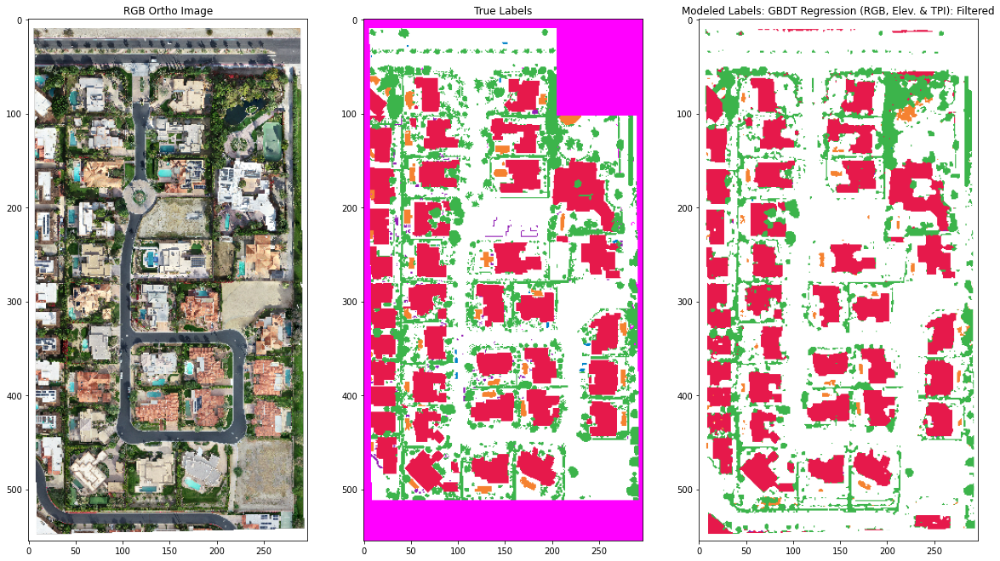

In [60]:
plt.rcParams['figure.figsize'] = [20, 20]

from scipy import ndimage
imagelabel_value_model_elevation_median = ndimage.median_filter(imagelabel_value_model_elevation, size=2)
imagelabel_model_elevation_median = label2rgb(imagelabel_value_model_elevation_median)
imagelabel_model_elevation_median = np.dstack([imagelabel_model_elevation_median,imageRGBA[:,:,3]])

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB Ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('True Labels')
axs[2].imshow(imagelabel_model_elevation_median);axs[2].set_title('Modeled Labels: GBDT Regression (RGB, Elev. & TPI): Filtered')